In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, chi2_contingency
import os

In [2]:
# load the data
def load_data(path : str) -> pd.DataFrame:
    current_dir = os.path.join(os.getcwd())
    parent_dir = os.path.dirname(current_dir)
    data_path = os.path.join(parent_dir, path)

    if not os.path.exists(data_path):
        raise FileNotFoundError(f"Data file not found at {data_path}")
    
    df = pd.read_csv(data_path)
    return df

    

In [3]:
# data loading
df = load_data('data/raw/weather_data.csv')

In [4]:
# first five rows of dataframe
df.head()

,time,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,rain,snowfall,weather_code,pressure_msl,...,soil_moisture_3_9cm,soil_moisture_9_27cm,soil_moisture_27_81cm,is_day,sunshine_duration,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,terrestrial_radiation
0,2025-01-01 00:00:00+00:00,13.4,99.0,13.2,13.3,0.0,0.0,0.0,0,1014.8,...,NaN,NaN,NaN,False,0.00,0.0,0.0,0.0,0.0,0.0
1,2025-01-01 01:00:00+00:00,13.3,99.0,13.1,13.4,0.0,0.0,0.0,3,1016.0,...,NaN,NaN,NaN,True,0.00,1.0,0.0,1.0,0.0,12.1
2,2025-01-01 02:00:00+00:00,14.4,96.0,13.8,14.3,0.0,0.0,0.0,3,1016.9,...,NaN,NaN,NaN,True,108.52,53.0,10.0,43.0,64.5,191.0
3,2025-01-01 03:00:00+00:00,15.9,88.0,13.9,15.5,0.0,0.0,0.0,3,1017.8,...,NaN,NaN,NaN,True,408.27,148.0,24.0,124.0,73.6,461.2
4,2025-01-01 04:00:00+00:00,18.0,79.0,14.4,18.2,0.0,0.0,0.0,1,1017.9,...,NaN,NaN,NaN,True,3600.00,296.0,124.0,172.0,256.4,684.2


In [8]:
# weather description count
weather_code_map = {
    0: "Clear sky",
    1: "Mainly clear",
    2: "Partly cloudy",
    3: "Overcast",
    45: "Fog",
    48: "Depositing rime fog",
    51: "Light drizzle",
    53: "Moderate drizzle",
    55: "Dense drizzle",
    56: "Light freezing drizzle",
    57: "Dense freezing drizzle",
    61: "Slight rain",
    63: "Moderate rain",
    65: "Heavy rain",
    66: "Light freezing rain",
    67: "Heavy freezing rain",
    71: "Slight snowfall",
    73: "Moderate snowfall",
    75: "Heavy snowfall",
    77: "Snow grains",
    80: "Slight rain showers",
    81: "Moderate rain showers",
    82: "Violent rain showers",
    85: "Slight snow showers",
    86: "Heavy snow showers",
    95: "Slight or moderate thunderstorm",
    96: "Thunderstorm with slight hail",
    99: "Thunderstorm with heavy hail"
}

In [9]:
# select relevant features for temprature classification
features = [
    "time",
    'temperature_2m',
    "relative_humidity_2m",
    "dew_point_2m",
    "apparent_temperature",
    "precipitation",
    "pressure_msl",
    "cloudcover",
    "cloudcover_low",
    "cloudcover_mid",
    "cloudcover_high",
    "windspeed_10m",
    "windgusts_10m",
    "winddirection_10m",
    "sunshine_duration",
    "shortwave_radiation",
    "diffuse_radiation",
    "direct_radiation",
    "terrestrial_radiation",
]

target = df['weather_code'].map(weather_code_map).values

main_df = df[features]

main_df.insert(1, 'weather_code_map', target)

In [10]:
main_df.head()

,time,weather_code_map,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,pressure_msl,cloudcover,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,windgusts_10m,winddirection_10m,sunshine_duration,shortwave_radiation,diffuse_radiation,direct_radiation,terrestrial_radiation
0,2025-01-01 00:00:00+00:00,Clear sky,13.4,99.0,13.2,13.3,0.0,1014.8,0.0,0.0,0.0,0.0,7.3,14.4,301.0,0.00,0.0,0.0,0.0,0.0
1,2025-01-01 01:00:00+00:00,Overcast,13.3,99.0,13.1,13.4,0.0,1016.0,93.0,93.0,0.0,0.0,5.8,14.8,304.0,0.00,1.0,1.0,0.0,12.1
2,2025-01-01 02:00:00+00:00,Overcast,14.4,96.0,13.8,14.3,0.0,1016.9,100.0,100.0,0.0,0.0,9.4,17.6,313.0,108.52,53.0,43.0,10.0,191.0
3,2025-01-01 03:00:00+00:00,Overcast,15.9,88.0,13.9,15.5,0.0,1017.8,90.0,90.0,0.0,0.0,11.4,23.4,319.0,408.27,148.0,124.0,24.0,461.2
4,2025-01-01 04:00:00+00:00,Mainly clear,18.0,79.0,14.4,18.2,0.0,1017.9,31.0,31.0,0.0,0.0,8.5,23.0,324.0,3600.00,296.0,172.0,124.0,684.2


In [11]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222792 entries, 0 to 222791
Data columns (total 20 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   time                   222792 non-null  object 
 1   weather_code_map       222792 non-null  object 
 2   temperature_2m         222792 non-null  float64
 3   relative_humidity_2m   222792 non-null  float64
 4   dew_point_2m           222792 non-null  float64
 5   apparent_temperature   222792 non-null  float64
 6   precipitation          222792 non-null  float64
 7   pressure_msl           222792 non-null  float64
 8   cloudcover             222792 non-null  float64
 9   cloudcover_low         222792 non-null  float64
 10  cloudcover_mid         222792 non-null  float64
 11  cloudcover_high        222792 non-null  float64
 12  windspeed_10m          222792 non-null  float64
 13  windgusts_10m          222792 non-null  float64
 14  winddirection_10m      222792 non-nu

In [12]:
main_df['weather_code_map'].value_counts()

weather_code_map
Clear sky           85012
Overcast            45923
Light drizzle       28072
Mainly clear        24665
Partly cloudy       15860
Moderate drizzle     8870
Slight rain          6195
Moderate rain        4639
Dense drizzle        2999
Heavy rain            557
Name: count, dtype: int64

In [14]:
# select only two weather codes for simplicity
main_df[main_df['weather_code_map'].isin(['Clear sky', 'Overcast'])].reset_index(drop=True, inplace=True)

In [15]:
main_df.head()

,time,weather_code_map,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,precipitation,pressure_msl,cloudcover,cloudcover_low,cloudcover_mid,cloudcover_high,windspeed_10m,windgusts_10m,winddirection_10m,sunshine_duration,shortwave_radiation,diffuse_radiation,direct_radiation,terrestrial_radiation
0,2025-01-01 00:00:00+00:00,Clear sky,13.4,99.0,13.2,13.3,0.0,1014.8,0.0,0.0,0.0,0.0,7.3,14.4,301.0,0.00,0.0,0.0,0.0,0.0
1,2025-01-01 01:00:00+00:00,Overcast,13.3,99.0,13.1,13.4,0.0,1016.0,93.0,93.0,0.0,0.0,5.8,14.8,304.0,0.00,1.0,1.0,0.0,12.1
2,2025-01-01 02:00:00+00:00,Overcast,14.4,96.0,13.8,14.3,0.0,1016.9,100.0,100.0,0.0,0.0,9.4,17.6,313.0,108.52,53.0,43.0,10.0,191.0
3,2025-01-01 03:00:00+00:00,Overcast,15.9,88.0,13.9,15.5,0.0,1017.8,90.0,90.0,0.0,0.0,11.4,23.4,319.0,408.27,148.0,124.0,24.0,461.2
4,2025-01-01 04:00:00+00:00,Mainly clear,18.0,79.0,14.4,18.2,0.0,1017.9,31.0,31.0,0.0,0.0,8.5,23.0,324.0,3600.00,296.0,172.0,124.0,684.2


In [16]:
main_df.columns

Index(['time', 'weather_code_map', 'temperature_2m', 'relative_humidity_2m',
       'dew_point_2m', 'apparent_temperature', 'precipitation', 'pressure_msl',
       'cloudcover', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_high',
       'windspeed_10m', 'windgusts_10m', 'winddirection_10m',
       'sunshine_duration', 'shortwave_radiation', 'diffuse_radiation',
       'direct_radiation', 'terrestrial_radiation'],
      dtype='object')

In [32]:
# number of null values
main_df.isna().sum()

time                     0
weather_code_map         0
temperature_2m           0
relative_humidity_2m     0
dew_point_2m             0
apparent_temperature     0
precipitation            0
pressure_msl             0
cloudcover               0
cloudcover_low           0
cloudcover_mid           0
cloudcover_high          0
windspeed_10m            0
windgusts_10m            0
winddirection_10m        0
sunshine_duration        0
shortwave_radiation      0
diffuse_radiation        0
direct_radiation         0
terrestrial_radiation    0
dtype: int64

In [34]:
# duplicated values
main_df.duplicated().sum()

0

In [37]:
class BivariateAnalyzer:
    def __init__(self, df, target_threshold=12):
        self.df = df
        self.target_threshold = target_threshold
    
    def is_categorical(self, series):
        return series.nunique() <= self.target_threshold or series.dtype == 'object'

    def analyze(self, col1, col2):
        if self.df[col1].isnull().any() or self.df[col2].isnull().any():
            print(f"Warning: Missing values found in {col1} or {col2}, dropping NaNs.")
            df_clean = self.df[[col1, col2]].dropna()
        else:
            df_clean = self.df[[col1, col2]]

        cat1 = self.is_categorical(df_clean[col1])
        cat2 = self.is_categorical(df_clean[col2])

        if cat1 and cat2:
            self.categorical_vs_categorical(df_clean, col1, col2)
        elif cat1 and not cat2:
            self.categorical_vs_numerical(df_clean, cat_col=col1, num_col=col2)
        elif not cat1 and cat2:
            self.categorical_vs_numerical(df_clean, cat_col=col2, num_col=col1)
        else:
            self.numerical_vs_numerical(df_clean, col1, col2)

    def categorical_vs_categorical(self, df, col1, col2):
        print(f"\n[Categorical vs Categorical] {col1} vs {col2}")
        ct = pd.crosstab(df[col1], df[col2])
        print("Cross-tabulation:\n", ct)

        chi2, p, _, _ = chi2_contingency(ct)
        print(f"\nChi-square Test: Chi2 = {chi2:.2f}, p-value = {p:.4f}")

        plt.figure(figsize=(10, 6))
        sns.heatmap(ct, annot=True, fmt='d', cmap='Blues')
        plt.title(f"Heatmap: {col1} vs {col2}")
        plt.ylabel(col1)
        plt.xlabel(col2)
        plt.show()

    def categorical_vs_numerical(self, df, cat_col, num_col):
        print(f"\n[Categorical vs Numerical] {cat_col} vs {num_col}")
        group_stats = df.groupby(cat_col)[num_col].agg(['mean', 'std', 'count'])
        print("Group-wise statistics:\n", group_stats)

        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df)
        plt.title(f"Boxplot of {num_col} by {cat_col}")
        plt.xticks(rotation=45)
        plt.show()

    def numerical_vs_numerical(self, df, col1, col2):
        print(f"\n[Numerical vs Numerical] {col1} vs {col2}")
        correlation, p_value = pearsonr(df[col1], df[col2])
        print(f"Pearson Correlation: {correlation:.3f}, p-value = {p_value:.4f}")

        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=col1, y=col2, data=df)
        sns.regplot(x=col1, y=col2, data=df, scatter=False, color='red')
        plt.title(f"Scatterplot: {col1} vs {col2}")
        plt.show()


In [38]:
col = main_df.columns[1:]
col

Index(['weather_code_map', 'temperature_2m', 'relative_humidity_2m',
       'dew_point_2m', 'apparent_temperature', 'precipitation', 'pressure_msl',
       'cloudcover', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_high',
       'windspeed_10m', 'windgusts_10m', 'winddirection_10m',
       'sunshine_duration', 'shortwave_radiation', 'diffuse_radiation',
       'direct_radiation', 'terrestrial_radiation'],
      dtype='object')

In [42]:
from itertools import combinations
import seaborn as sns

all_pairs = list(combinations(col, 2))
print(f"Total pairs: {len(all_pairs)}")
for pair in all_pairs:
    print(pair)

Total pairs: 171
('weather_code_map', 'temperature_2m')
('weather_code_map', 'relative_humidity_2m')
('weather_code_map', 'dew_point_2m')
('weather_code_map', 'apparent_temperature')
('weather_code_map', 'precipitation')
('weather_code_map', 'pressure_msl')
('weather_code_map', 'cloudcover')
('weather_code_map', 'cloudcover_low')
('weather_code_map', 'cloudcover_mid')
('weather_code_map', 'cloudcover_high')
('weather_code_map', 'windspeed_10m')
('weather_code_map', 'windgusts_10m')
('weather_code_map', 'winddirection_10m')
('weather_code_map', 'sunshine_duration')
('weather_code_map', 'shortwave_radiation')
('weather_code_map', 'diffuse_radiation')
('weather_code_map', 'direct_radiation')
('weather_code_map', 'terrestrial_radiation')
('temperature_2m', 'relative_humidity_2m')
('temperature_2m', 'dew_point_2m')
('temperature_2m', 'apparent_temperature')
('temperature_2m', 'precipitation')
('temperature_2m', 'pressure_msl')
('temperature_2m', 'cloudcover')
('temperature_2m', 'cloudcover_


[Categorical vs Numerical] weather_code_map vs temperature_2m
Group-wise statistics:
                        mean       std  count
weather_code_map                            
Clear sky         22.203557  5.840854  85012
Dense drizzle     26.336479  2.701169   2999
Heavy rain        25.168761  2.393913    557
Light drizzle     27.864035  2.993320  28072
Mainly clear      25.541241  5.354769  24665
Moderate drizzle  26.439594  2.778434   8870
Moderate rain     25.881957  2.736983   4639
Overcast          26.078242  4.227315  45923
Partly cloudy     25.300088  5.136783  15860
Slight rain       26.154931  2.784260   6195


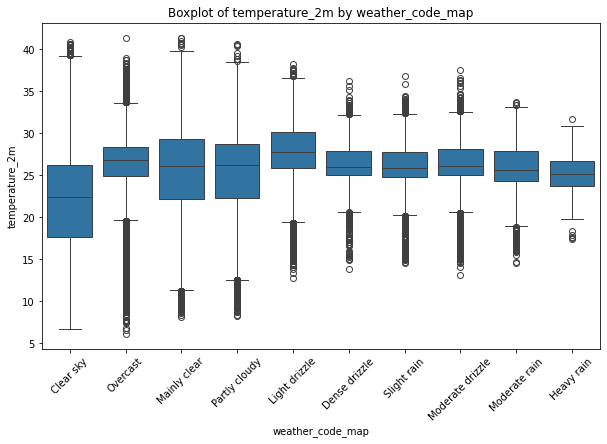


[Categorical vs Numerical] weather_code_map vs relative_humidity_2m
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky         70.404966  19.258230  85012
Dense drizzle     89.576526   9.326202   2999
Heavy rain        92.229803   5.698445    557
Light drizzle     82.768168  10.892146  28072
Mainly clear      72.370241  17.441988  24665
Moderate drizzle  88.825592   9.450187   8870
Moderate rain     90.657469   7.943916   4639
Overcast          82.580581  13.241280  45923
Partly cloudy     76.546595  16.235989  15860
Slight rain       90.137369   8.674560   6195


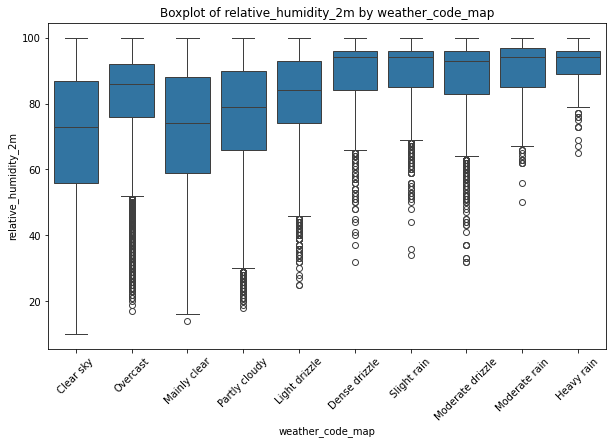


[Categorical vs Numerical] weather_code_map vs dew_point_2m
Group-wise statistics:
                        mean       std  count
weather_code_map                            
Clear sky         15.819240  4.984878  85012
Dense drizzle     24.370890  2.006288   2999
Heavy rain        23.779354  2.067474    557
Light drizzle     24.490140  2.133714  28072
Mainly clear      19.651421  4.969474  24665
Moderate drizzle  24.327892  2.105730   8870
Moderate rain     24.154300  1.930173   4639
Overcast          22.622777  4.340120  45923
Partly cloudy     20.444805  5.079091  15860
Slight rain       24.309475  1.986926   6195


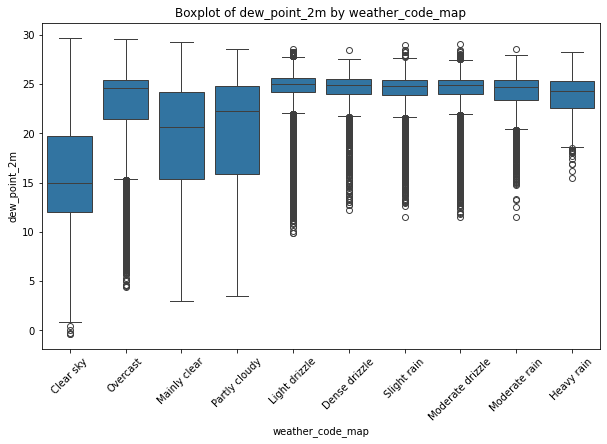


[Categorical vs Numerical] weather_code_map vs apparent_temperature
Group-wise statistics:
                        mean       std  count
weather_code_map                            
Clear sky         23.594300  7.395062  85012
Dense drizzle     31.350050  3.679899   2999
Heavy rain        28.992101  4.070513    557
Light drizzle     33.007955  4.014105  28072
Mainly clear      28.714624  7.192149  24665
Moderate drizzle  31.422661  3.783938   8870
Moderate rain     30.566264  3.910056   4639
Overcast          30.374253  5.907431  45923
Partly cloudy     28.723310  7.035102  15860
Slight rain       31.081324  3.846792   6195


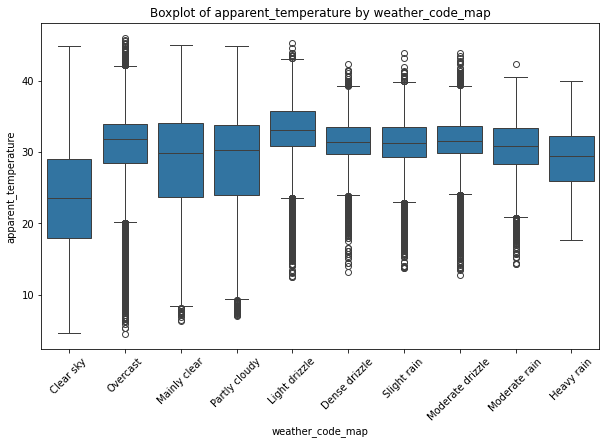


[Categorical vs Numerical] weather_code_map vs precipitation
Group-wise statistics:
                        mean       std  count
weather_code_map                            
Clear sky          0.000000  0.000000  85012
Dense drizzle      1.092564  0.081971   2999
Heavy rain        10.501975  3.228701    557
Light drizzle      0.202380  0.102155  28072
Mainly clear       0.000000  0.000000  24665
Moderate drizzle   0.667057  0.140988   8870
Moderate rain      3.907135  1.246018   4639
Overcast           0.000000  0.000000  45923
Partly cloudy      0.000000  0.000000  15860
Slight rain        1.750121  0.340062   6195


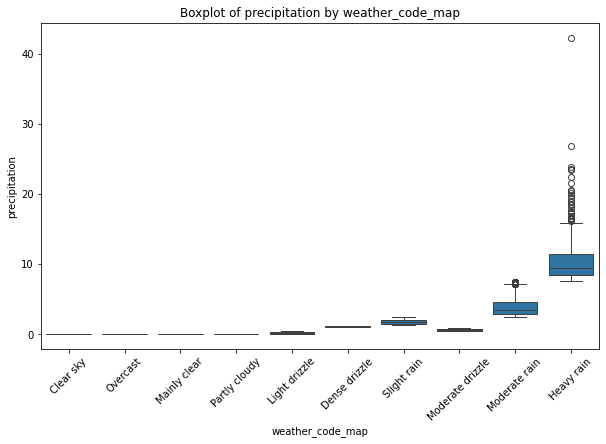


[Categorical vs Numerical] weather_code_map vs pressure_msl
Group-wise statistics:
                          mean       std  count
weather_code_map                              
Clear sky         1011.605000  4.574389  85012
Dense drizzle     1003.140547  4.287364   2999
Heavy rain        1002.520467  4.645181    557
Light drizzle     1003.626033  4.381754  28072
Mainly clear      1008.923438  5.351007  24665
Moderate drizzle  1003.245445  4.346443   8870
Moderate rain     1002.913861  4.297440   4639
Overcast          1005.426599  5.778771  45923
Partly cloudy     1008.095549  5.780636  15860
Slight rain       1003.096852  4.293733   6195


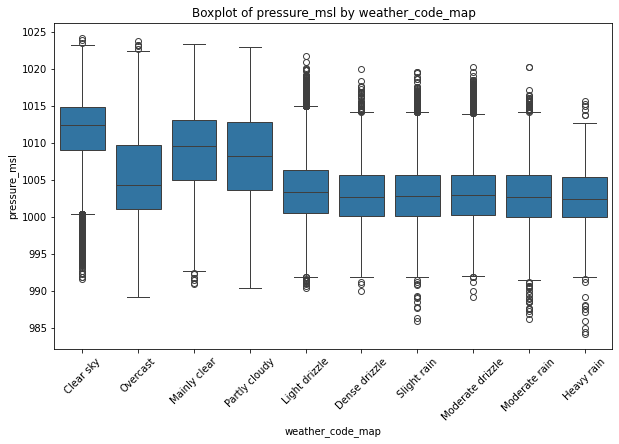


[Categorical vs Numerical] weather_code_map vs cloudcover
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky          3.621018   5.388937  85012
Dense drizzle     91.491164  17.775615   2999
Heavy rain        97.842011   9.515237    557
Light drizzle     82.912154  24.974361  28072
Mainly clear      32.677235   8.564847  24665
Moderate drizzle  89.465163  20.062184   8870
Moderate rain     93.866135  15.043360   4639
Overcast          95.989286   5.416250  45923
Partly cloudy     64.180769   8.877681  15860
Slight rain       91.908636  17.287948   6195


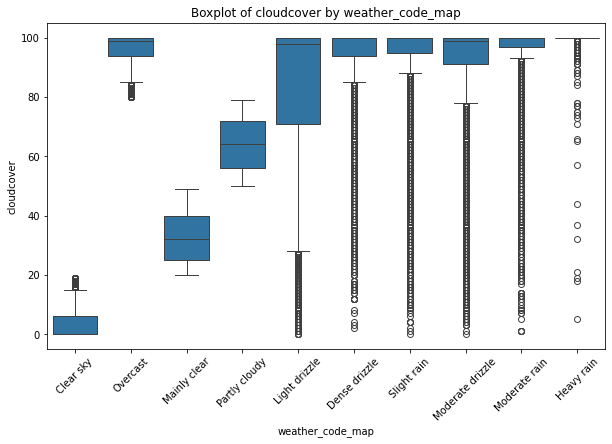


[Categorical vs Numerical] weather_code_map vs cloudcover_low
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky          1.482614   4.082836  85012
Dense drizzle     47.473825  37.062726   2999
Heavy rain        67.509874  35.565250    557
Light drizzle     41.024223  34.299311  28072
Mainly clear      12.271235  13.210719  24665
Moderate drizzle  44.341826  36.442773   8870
Moderate rain     57.372925  37.277622   4639
Overcast          31.035734  36.809905  45923
Partly cloudy     22.712232  25.333088  15860
Slight rain       50.748507  37.476593   6195


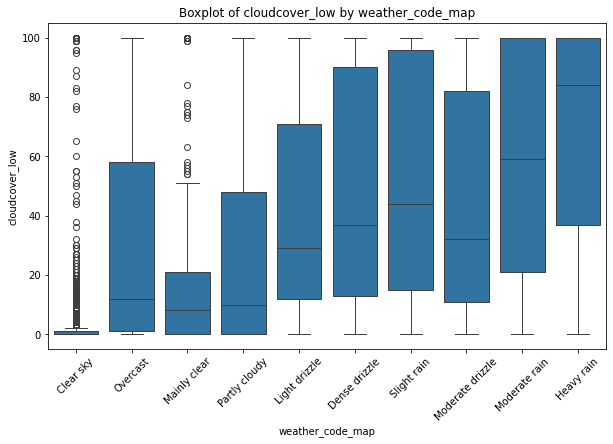


[Categorical vs Numerical] weather_code_map vs cloudcover_mid
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky          1.712841   3.846409  85012
Dense drizzle     47.203068  31.056714   2999
Heavy rain        61.355476  35.833940    557
Light drizzle     33.246331  26.878655  28072
Mainly clear      13.857044  12.749451  24665
Moderate drizzle  44.959188  30.160366   8870
Moderate rain     47.634188  32.804694   4639
Overcast          22.961849  27.063284  45923
Partly cloudy     16.021753  19.461525  15860
Slight rain       47.693301  31.784005   6195


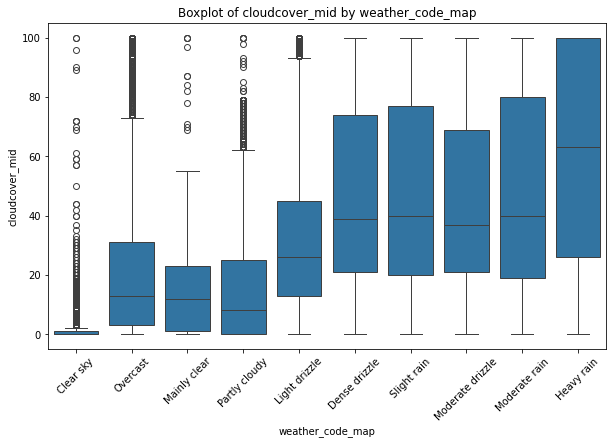


[Categorical vs Numerical] weather_code_map vs cloudcover_high
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky          0.771820   3.362767  85012
Dense drizzle     79.763921  30.298233   2999
Heavy rain        91.879713  19.629800    557
Light drizzle     64.495298  39.298272  28072
Mainly clear      11.553781  14.603072  24665
Moderate drizzle  76.062007  33.561181   8870
Moderate rain     83.999138  26.596217   4639
Overcast          79.418940  32.918367  45923
Partly cloudy     37.074653  28.334044  15860
Slight rain       80.855690  29.054937   6195


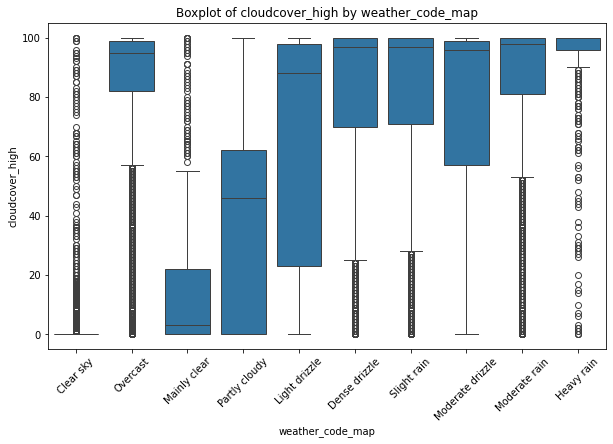


[Categorical vs Numerical] weather_code_map vs windspeed_10m
Group-wise statistics:
                        mean       std  count
weather_code_map                            
Clear sky          7.151167  2.871164  85012
Dense drizzle      9.579760  4.630689   2999
Heavy rain        15.126391  8.863116    557
Light drizzle      9.910078  4.781137  28072
Mainly clear       7.081987  3.433835  24665
Moderate drizzle   9.664149  4.579296   8870
Moderate rain     10.814076  5.484951   4639
Overcast           8.874973  4.273740  45923
Partly cloudy      7.703897  3.887348  15860
Slight rain        9.892074  4.779197   6195


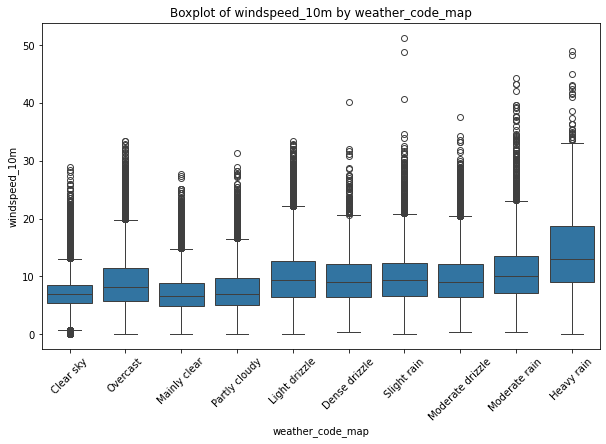


[Categorical vs Numerical] weather_code_map vs windgusts_10m
Group-wise statistics:
                        mean        std  count
weather_code_map                             
Clear sky         14.387376   6.387886  85012
Dense drizzle     22.274091   9.063850   2999
Heavy rain        35.005925  15.818025    557
Light drizzle     23.441810   8.768722  28072
Mainly clear      16.437551   7.530643  24665
Moderate drizzle  22.115626   8.776024   8870
Moderate rain     26.185579  10.227427   4639
Overcast          18.780707   8.625609  45923
Partly cloudy     17.307522   8.330612  15860
Slight rain       23.262437   9.134081   6195


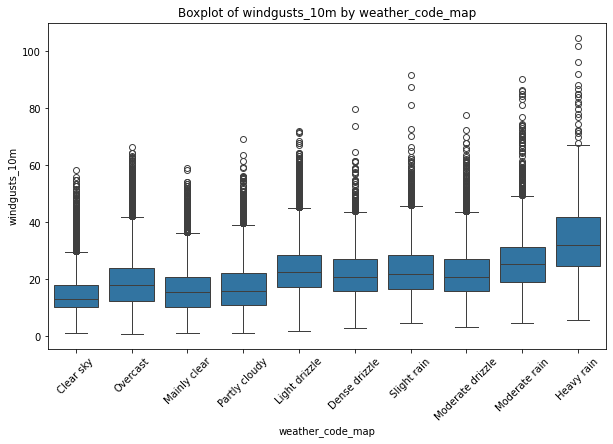


[Categorical vs Numerical] weather_code_map vs winddirection_10m
Group-wise statistics:
                         mean         std  count
weather_code_map                               
Clear sky         227.564991  106.294038  85012
Dense drizzle     136.894632   57.893373   2999
Heavy rain        125.687612   79.153021    557
Light drizzle     137.449558   55.632656  28072
Mainly clear      185.396229  102.609671  24665
Moderate drizzle  134.963923   56.627200   8870
Moderate rain     133.259539   66.554914   4639
Overcast          154.090107   81.612314  45923
Partly cloudy     176.246406   98.514207  15860
Slight rain       134.300888   59.467279   6195


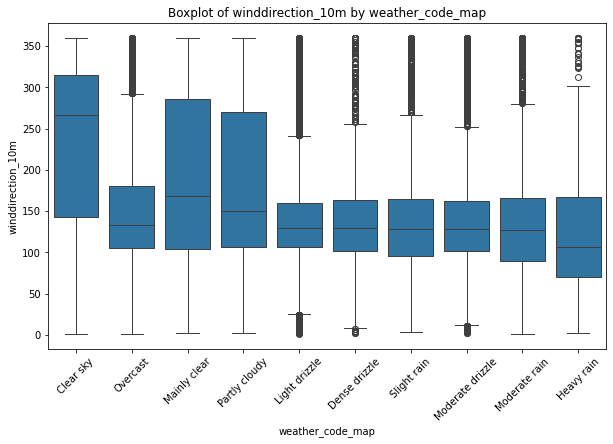


[Categorical vs Numerical] weather_code_map vs sunshine_duration
Group-wise statistics:
                          mean          std  count
weather_code_map                                 
Clear sky         1390.353295  1723.515751  85012
Dense drizzle      731.481891  1368.833836   2999
Heavy rain         375.664093   990.398467    557
Light drizzle     1627.131504  1702.300170  28072
Mainly clear      1870.047699  1767.189562  24665
Moderate drizzle   767.177842  1392.836655   8870
Moderate rain      708.262100  1330.494043   4639
Overcast           987.779939  1524.297074  45923
Partly cloudy     1673.274347  1742.560173  15860
Slight rain        726.386181  1359.833969   6195


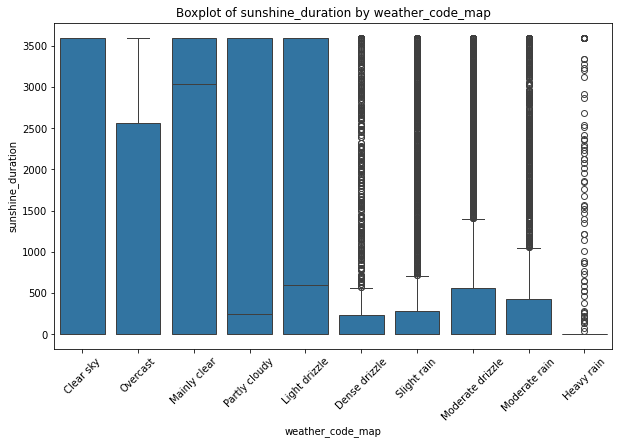


[Categorical vs Numerical] weather_code_map vs shortwave_radiation
Group-wise statistics:
                         mean         std  count
weather_code_map                               
Clear sky         186.562109  278.060734  85012
Dense drizzle     115.858953  176.221347   2999
Heavy rain         87.369838  140.362915    557
Light drizzle     255.057317  252.568558  28072
Mainly clear      254.779809  290.902723  24665
Moderate drizzle  121.257948  180.054035   8870
Moderate rain     120.622979  170.889845   4639
Overcast          140.125950  216.637936  45923
Partly cloudy     211.263052  261.218757  15860
Slight rain       115.730266  175.357938   6195


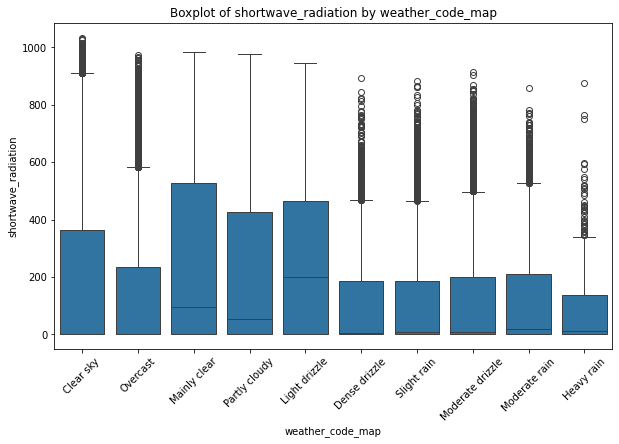


[Categorical vs Numerical] weather_code_map vs diffuse_radiation
Group-wise statistics:
                         mean         std  count
weather_code_map                               
Clear sky          44.006293   59.856290  85012
Dense drizzle      69.375792   93.808645   2999
Heavy rain         61.964093   87.587297    557
Light drizzle     123.762682  110.659695  28072
Mainly clear       75.766390   81.353996  24665
Moderate drizzle   70.775986   93.424660   8870
Moderate rain      75.619961   95.556179   4639
Overcast           70.134355   99.429633  45923
Partly cloudy      78.113367   91.789842  15860
Slight rain        68.862308   92.157272   6195


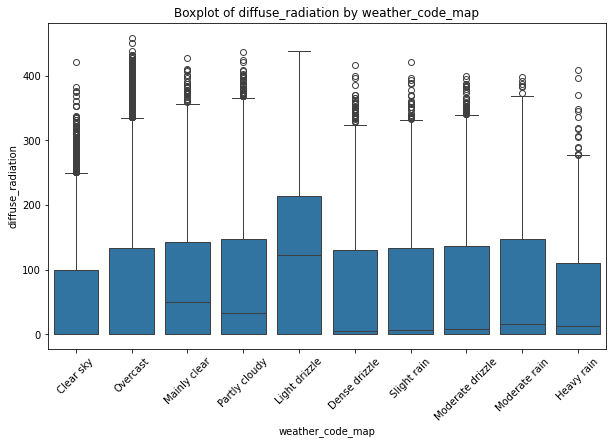


[Categorical vs Numerical] weather_code_map vs direct_radiation
Group-wise statistics:
                         mean         std  count
weather_code_map                               
Clear sky         142.555816  222.694213  85012
Dense drizzle      46.483161   97.883678   2999
Heavy rain         25.405745   66.654029    557
Light drizzle     131.294635  168.554566  28072
Mainly clear      179.013420  219.308006  24665
Moderate drizzle   50.481962  103.918250   8870
Moderate rain      45.003018   90.032762   4639
Overcast           69.991595  135.682294  45923
Partly cloudy     133.149685  185.006112  15860
Slight rain        46.867958   98.645672   6195


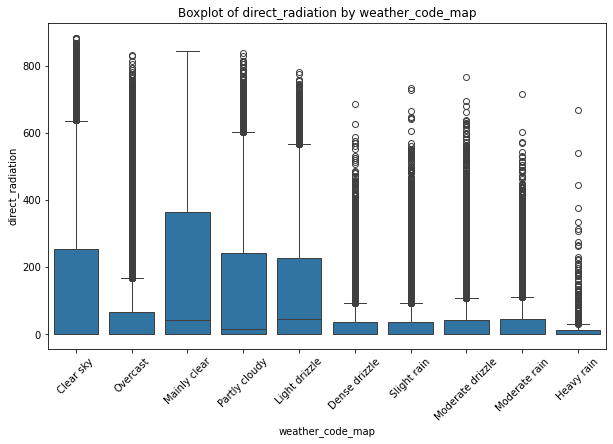


[Categorical vs Numerical] weather_code_map vs terrestrial_radiation
Group-wise statistics:
                         mean         std  count
weather_code_map                               
Clear sky         293.664318  410.085629  85012
Dense drizzle     403.101234  482.878825   2999
Heavy rain        477.744704  505.912978    557
Light drizzle     628.675855  511.638969  28072
Mainly clear      447.886361  473.353104  24665
Moderate drizzle  405.968072  480.125634   8870
Moderate rain     465.725135  497.997278   4639
Overcast          338.435586  452.747881  45923
Partly cloudy     412.822030  464.126277  15860
Slight rain       418.463390  487.138120   6195


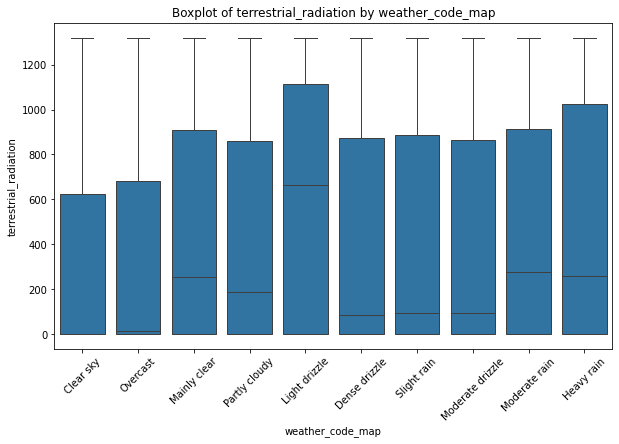


[Numerical vs Numerical] temperature_2m vs relative_humidity_2m
Pearson Correlation: -0.305, p-value = 0.0000


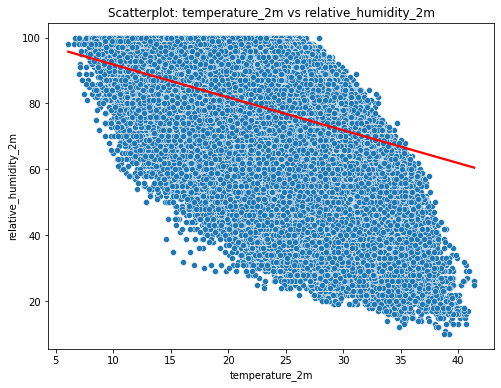


[Numerical vs Numerical] temperature_2m vs dew_point_2m
Pearson Correlation: 0.676, p-value = 0.0000


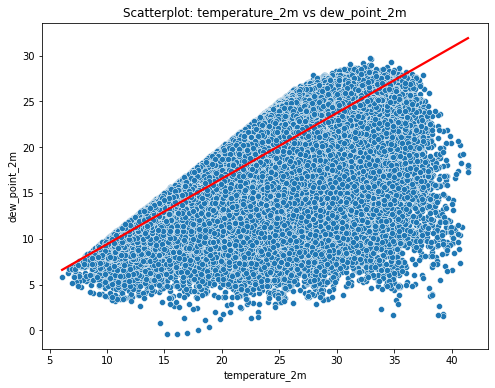


[Numerical vs Numerical] temperature_2m vs apparent_temperature
Pearson Correlation: 0.968, p-value = 0.0000


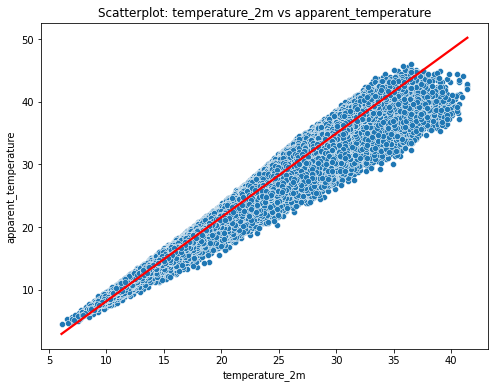


[Numerical vs Numerical] temperature_2m vs precipitation
Pearson Correlation: 0.069, p-value = 0.0000


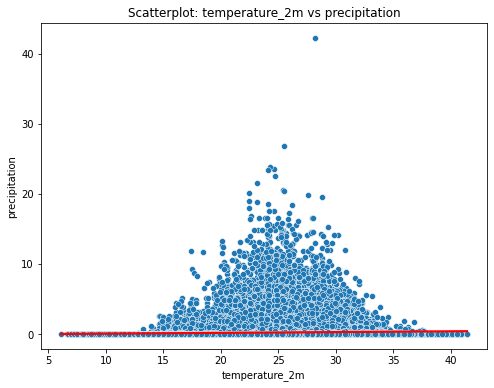


[Numerical vs Numerical] temperature_2m vs pressure_msl
Pearson Correlation: -0.657, p-value = 0.0000


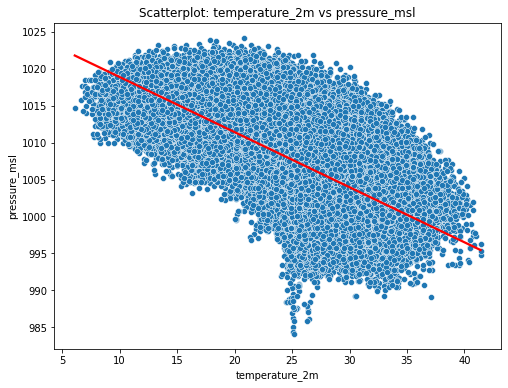


[Numerical vs Numerical] temperature_2m vs cloudcover
Pearson Correlation: 0.349, p-value = 0.0000


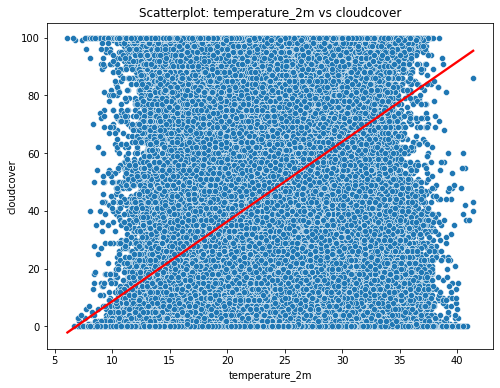


[Numerical vs Numerical] temperature_2m vs cloudcover_low
Pearson Correlation: 0.152, p-value = 0.0000


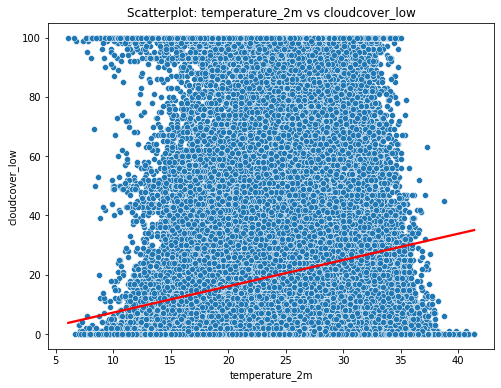


[Numerical vs Numerical] temperature_2m vs cloudcover_mid
Pearson Correlation: 0.207, p-value = 0.0000


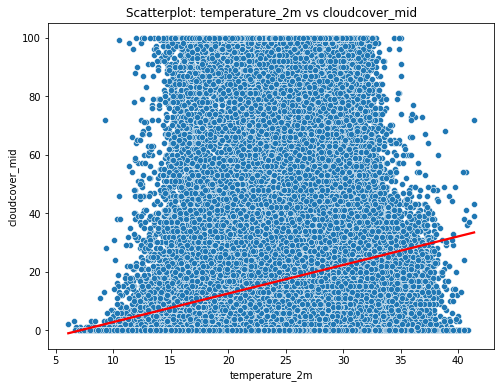


[Numerical vs Numerical] temperature_2m vs cloudcover_high
Pearson Correlation: 0.327, p-value = 0.0000


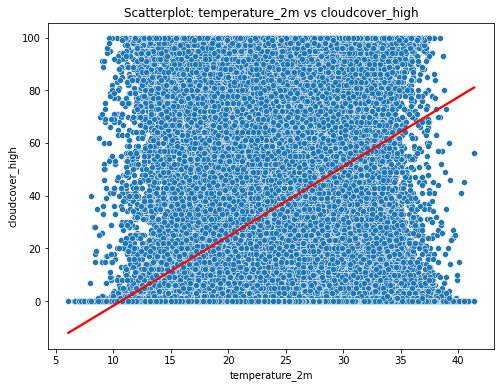


[Numerical vs Numerical] temperature_2m vs windspeed_10m
Pearson Correlation: 0.213, p-value = 0.0000


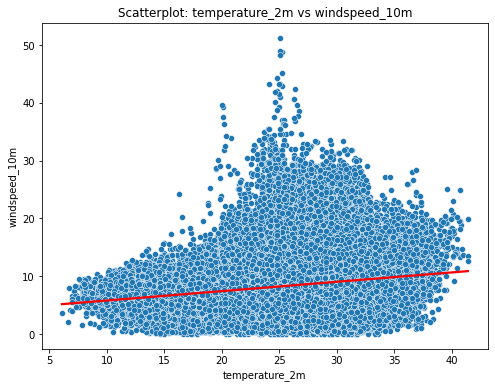


[Numerical vs Numerical] temperature_2m vs windgusts_10m
Pearson Correlation: 0.477, p-value = 0.0000


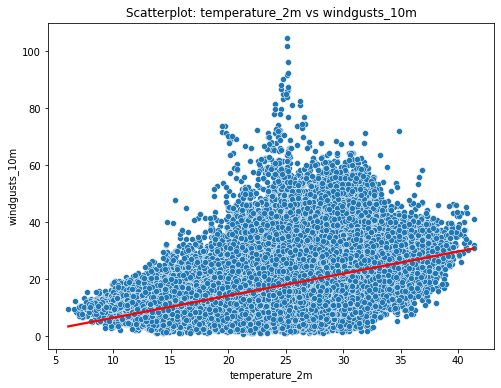


[Numerical vs Numerical] temperature_2m vs winddirection_10m
Pearson Correlation: -0.313, p-value = 0.0000


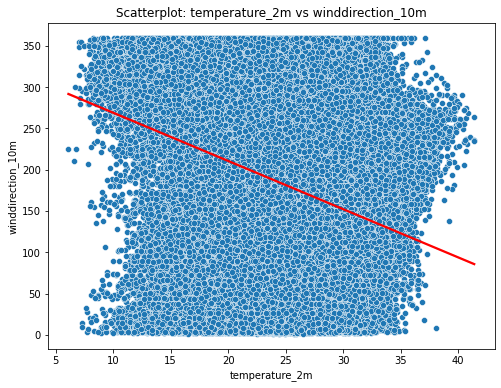


[Numerical vs Numerical] temperature_2m vs sunshine_duration
Pearson Correlation: 0.453, p-value = 0.0000


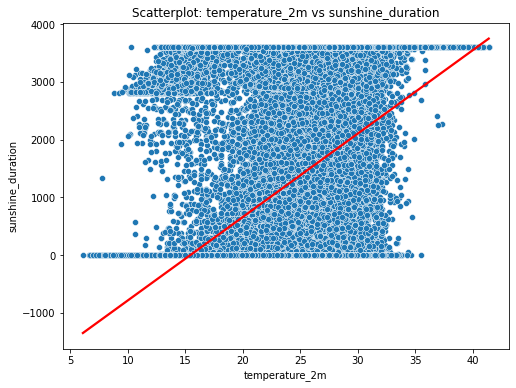


[Numerical vs Numerical] temperature_2m vs shortwave_radiation
Pearson Correlation: 0.526, p-value = 0.0000


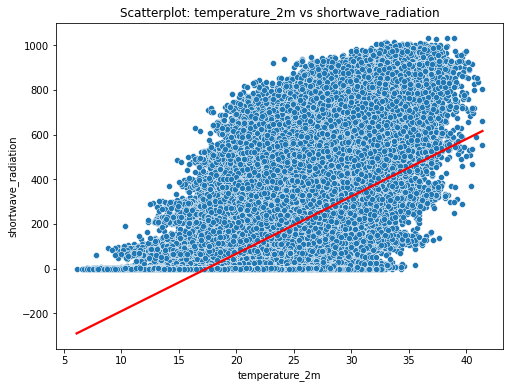


[Numerical vs Numerical] temperature_2m vs diffuse_radiation
Pearson Correlation: 0.540, p-value = 0.0000


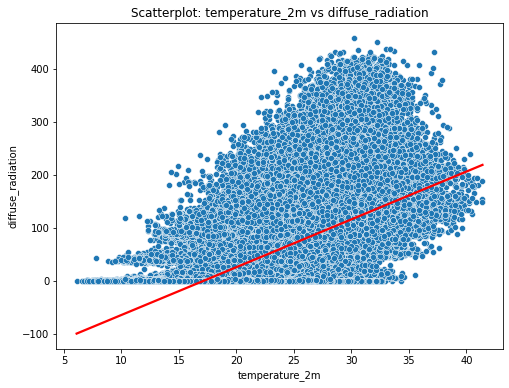


[Numerical vs Numerical] temperature_2m vs direct_radiation
Pearson Correlation: 0.460, p-value = 0.0000


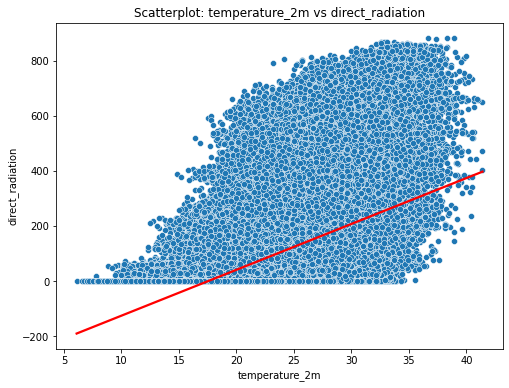


[Numerical vs Numerical] temperature_2m vs terrestrial_radiation
Pearson Correlation: 0.558, p-value = 0.0000


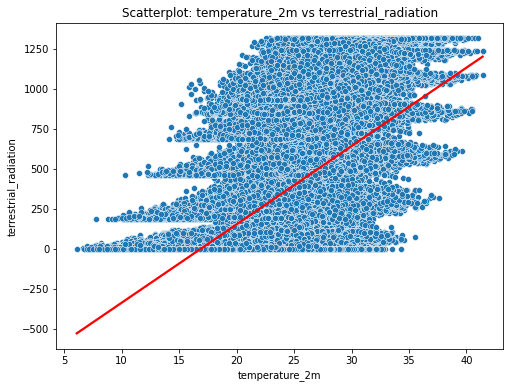


[Numerical vs Numerical] relative_humidity_2m vs dew_point_2m
Pearson Correlation: 0.483, p-value = 0.0000


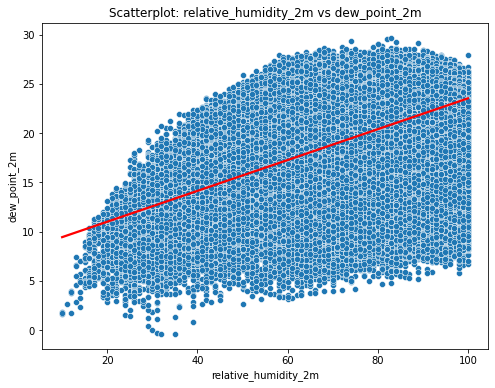


[Numerical vs Numerical] relative_humidity_2m vs apparent_temperature
Pearson Correlation: -0.077, p-value = 0.0000


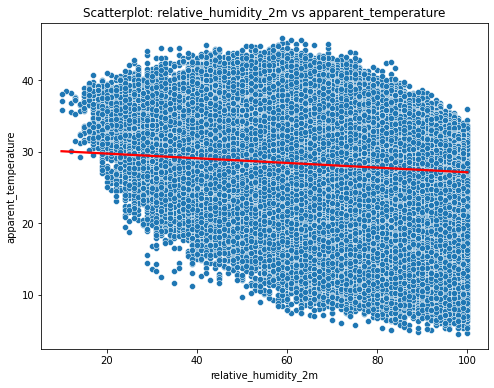


[Numerical vs Numerical] relative_humidity_2m vs precipitation
Pearson Correlation: 0.190, p-value = 0.0000


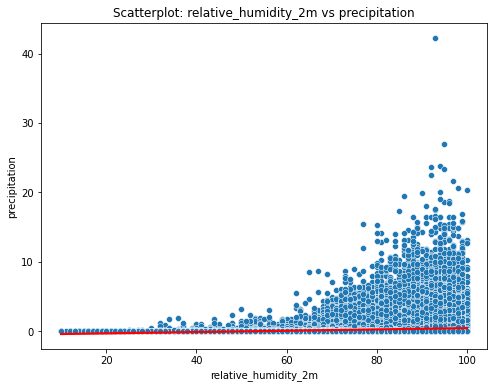


[Numerical vs Numerical] relative_humidity_2m vs pressure_msl
Pearson Correlation: -0.235, p-value = 0.0000


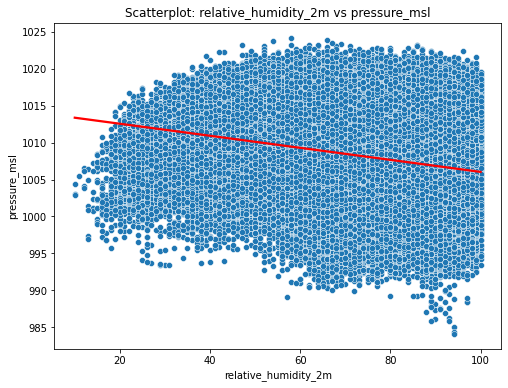


[Numerical vs Numerical] relative_humidity_2m vs cloudcover
Pearson Correlation: 0.387, p-value = 0.0000


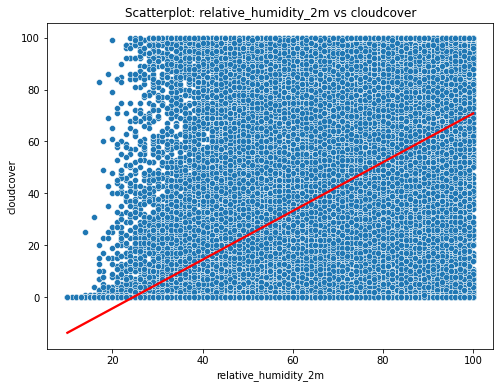


[Numerical vs Numerical] relative_humidity_2m vs cloudcover_low
Pearson Correlation: 0.318, p-value = 0.0000


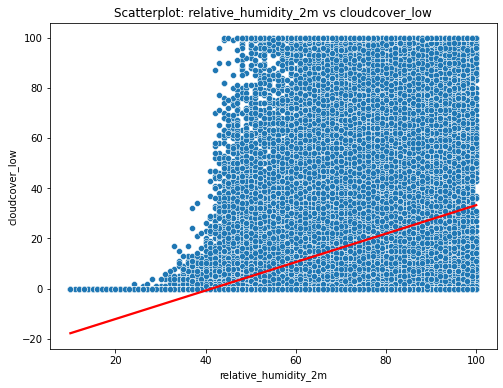


[Numerical vs Numerical] relative_humidity_2m vs cloudcover_mid
Pearson Correlation: 0.246, p-value = 0.0000


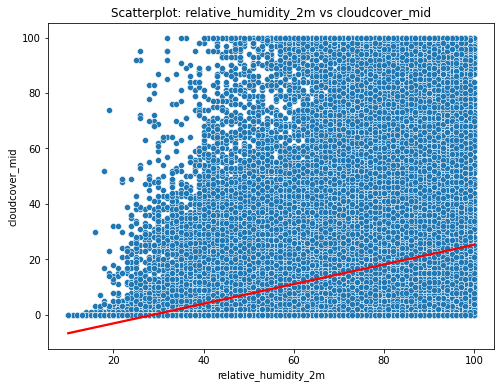


[Numerical vs Numerical] relative_humidity_2m vs cloudcover_high
Pearson Correlation: 0.337, p-value = 0.0000


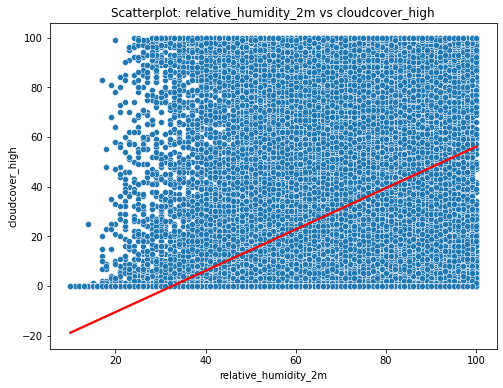


[Numerical vs Numerical] relative_humidity_2m vs windspeed_10m
Pearson Correlation: 0.055, p-value = 0.0000


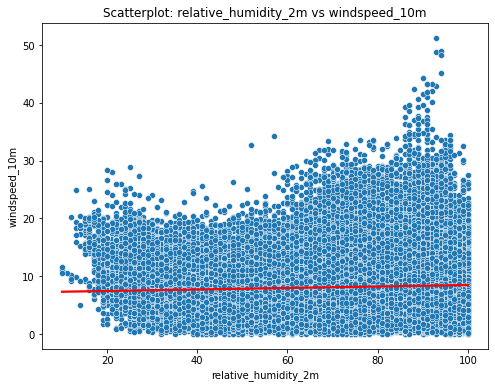


[Numerical vs Numerical] relative_humidity_2m vs windgusts_10m
Pearson Correlation: -0.140, p-value = 0.0000


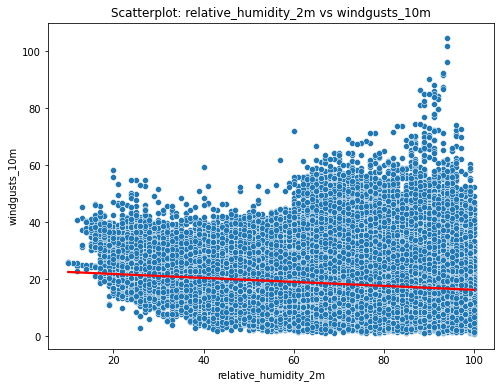


[Numerical vs Numerical] relative_humidity_2m vs winddirection_10m
Pearson Correlation: -0.310, p-value = 0.0000


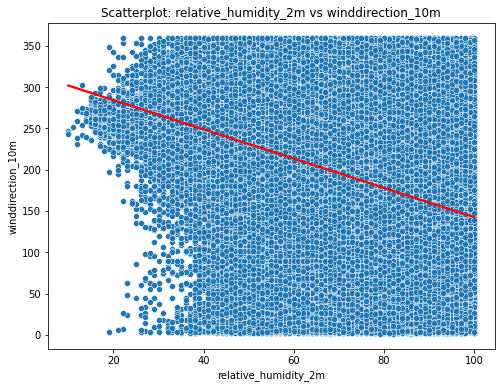


[Numerical vs Numerical] relative_humidity_2m vs sunshine_duration
Pearson Correlation: -0.626, p-value = 0.0000


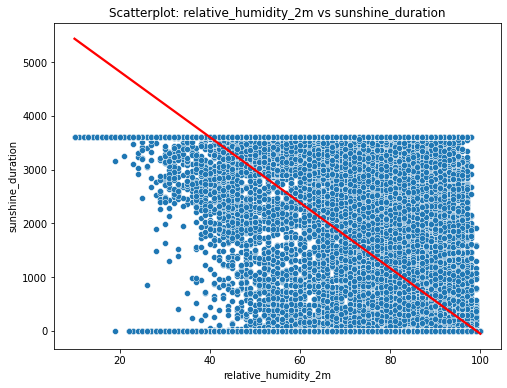


[Numerical vs Numerical] relative_humidity_2m vs shortwave_radiation
Pearson Correlation: -0.648, p-value = 0.0000


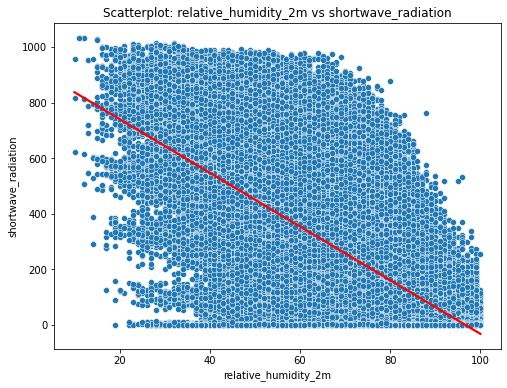


[Numerical vs Numerical] relative_humidity_2m vs diffuse_radiation
Pearson Correlation: -0.420, p-value = 0.0000


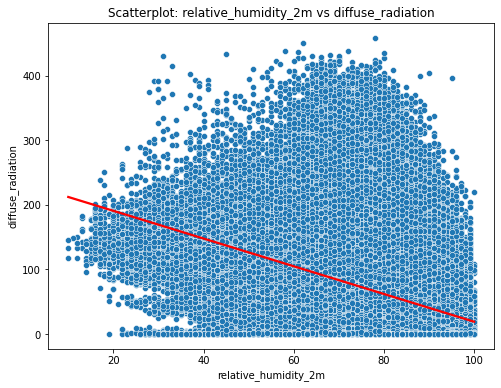


[Numerical vs Numerical] relative_humidity_2m vs direct_radiation
Pearson Correlation: -0.680, p-value = 0.0000


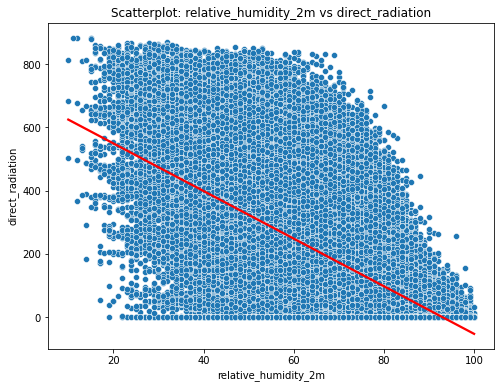


[Numerical vs Numerical] relative_humidity_2m vs terrestrial_radiation
Pearson Correlation: -0.505, p-value = 0.0000


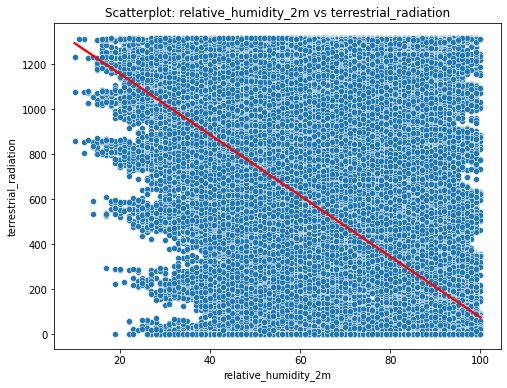


[Numerical vs Numerical] dew_point_2m vs apparent_temperature
Pearson Correlation: 0.825, p-value = 0.0000


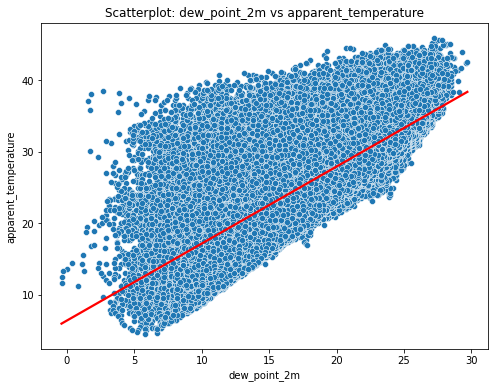


[Numerical vs Numerical] dew_point_2m vs precipitation
Pearson Correlation: 0.198, p-value = 0.0000


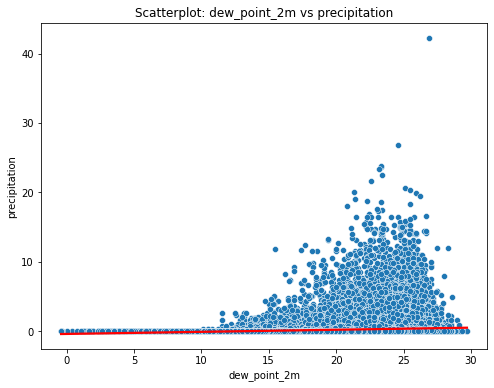


[Numerical vs Numerical] dew_point_2m vs pressure_msl
Pearson Correlation: -0.771, p-value = 0.0000


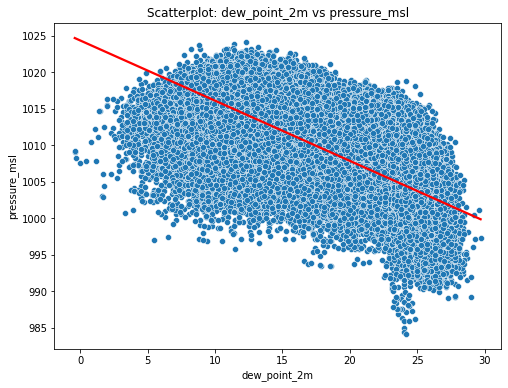


[Numerical vs Numerical] dew_point_2m vs cloudcover
Pearson Correlation: 0.611, p-value = 0.0000


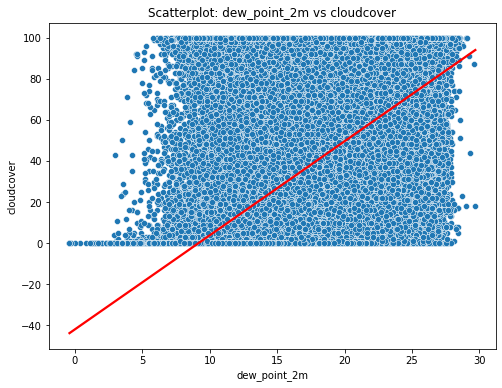


[Numerical vs Numerical] dew_point_2m vs cloudcover_low
Pearson Correlation: 0.373, p-value = 0.0000


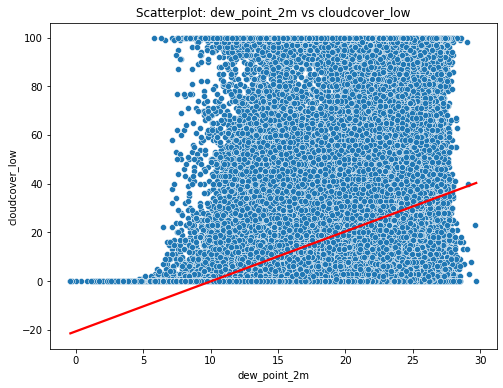


[Numerical vs Numerical] dew_point_2m vs cloudcover_mid
Pearson Correlation: 0.374, p-value = 0.0000


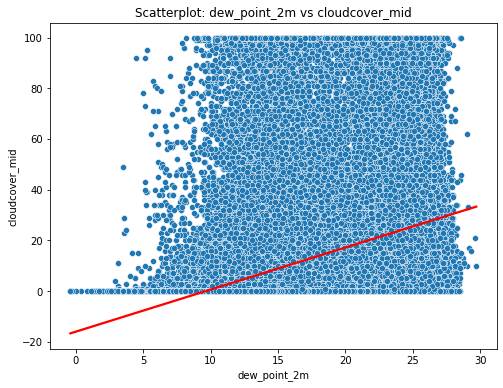


[Numerical vs Numerical] dew_point_2m vs cloudcover_high
Pearson Correlation: 0.552, p-value = 0.0000


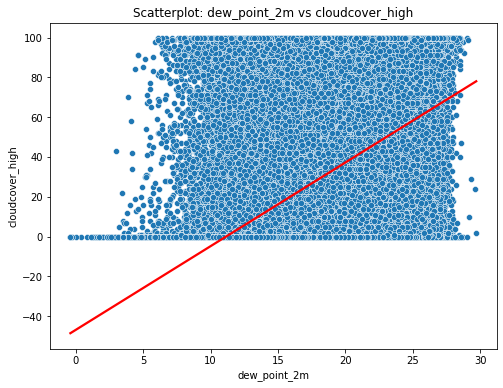


[Numerical vs Numerical] dew_point_2m vs windspeed_10m
Pearson Correlation: 0.230, p-value = 0.0000


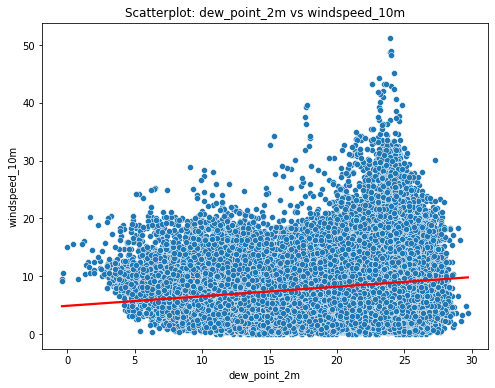


[Numerical vs Numerical] dew_point_2m vs windgusts_10m
Pearson Correlation: 0.328, p-value = 0.0000


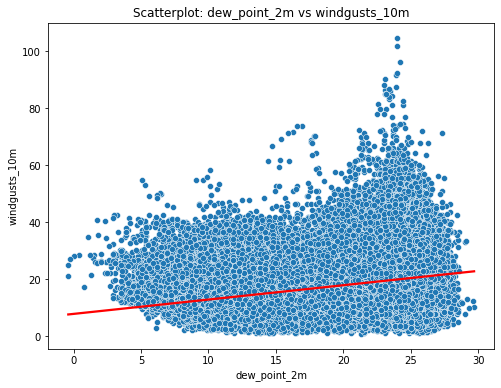


[Numerical vs Numerical] dew_point_2m vs winddirection_10m
Pearson Correlation: -0.522, p-value = 0.0000


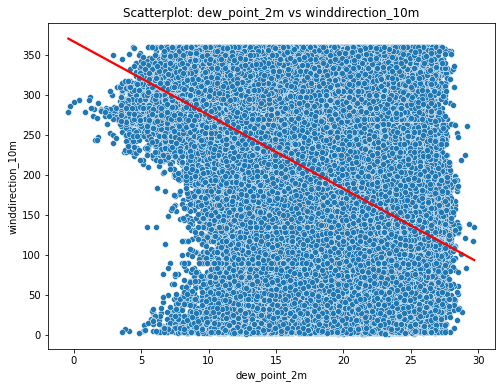


[Numerical vs Numerical] dew_point_2m vs sunshine_duration
Pearson Correlation: -0.047, p-value = 0.0000


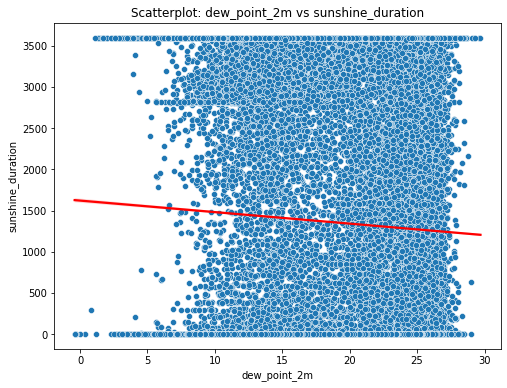


[Numerical vs Numerical] dew_point_2m vs shortwave_radiation
Pearson Correlation: -0.011, p-value = 0.0000


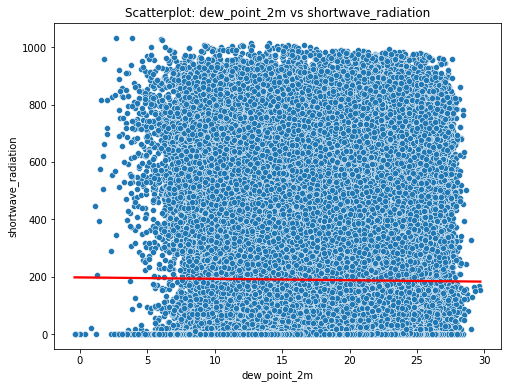


[Numerical vs Numerical] dew_point_2m vs diffuse_radiation
Pearson Correlation: 0.196, p-value = 0.0000


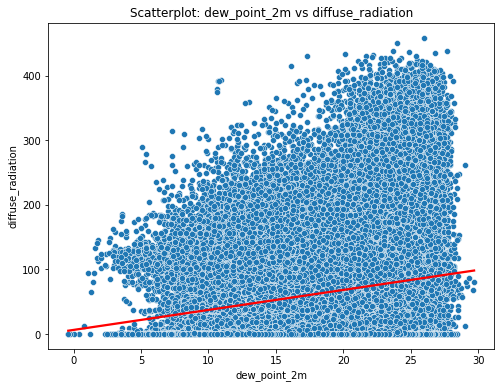


[Numerical vs Numerical] dew_point_2m vs direct_radiation
Pearson Correlation: -0.105, p-value = 0.0000


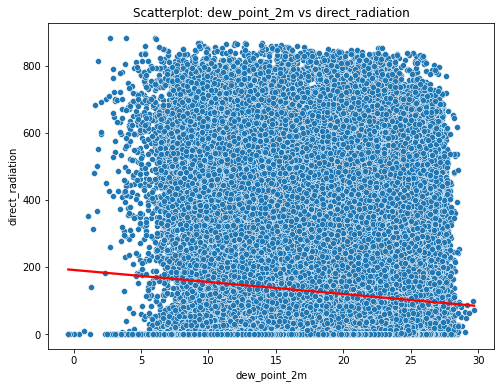


[Numerical vs Numerical] dew_point_2m vs terrestrial_radiation
Pearson Correlation: 0.137, p-value = 0.0000


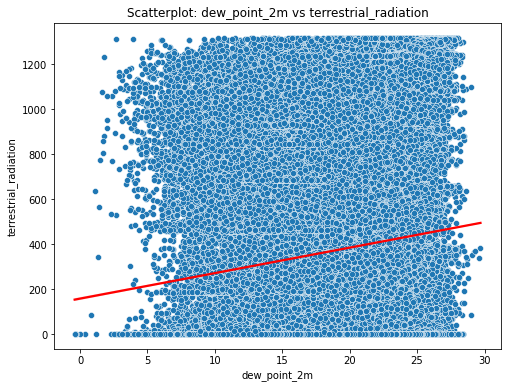


[Numerical vs Numerical] apparent_temperature vs precipitation
Pearson Correlation: 0.105, p-value = 0.0000


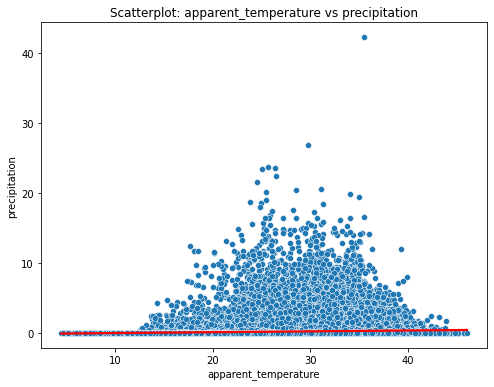


[Numerical vs Numerical] apparent_temperature vs pressure_msl
Pearson Correlation: -0.729, p-value = 0.0000


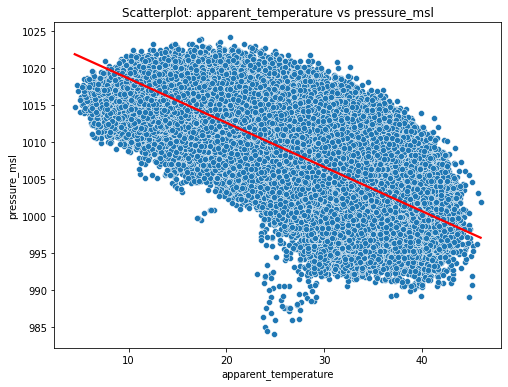


[Numerical vs Numerical] apparent_temperature vs cloudcover
Pearson Correlation: 0.448, p-value = 0.0000


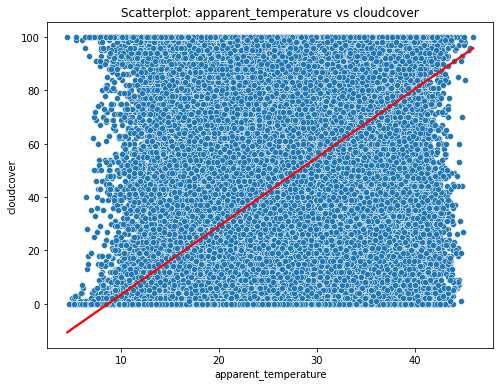


[Numerical vs Numerical] apparent_temperature vs cloudcover_low
Pearson Correlation: 0.215, p-value = 0.0000


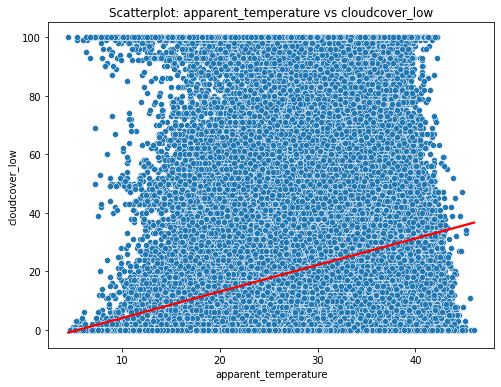


[Numerical vs Numerical] apparent_temperature vs cloudcover_mid
Pearson Correlation: 0.261, p-value = 0.0000


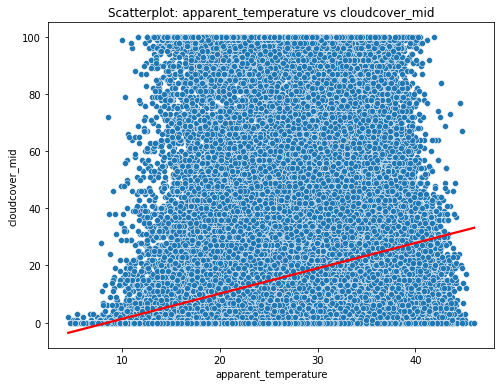


[Numerical vs Numerical] apparent_temperature vs cloudcover_high
Pearson Correlation: 0.417, p-value = 0.0000


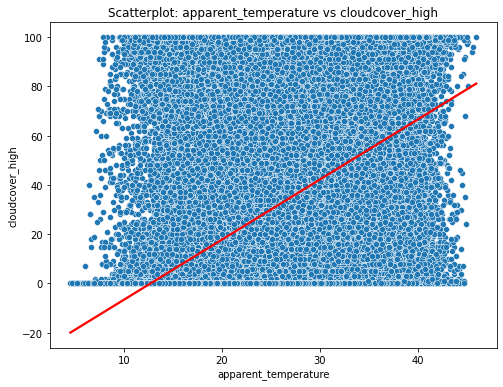


[Numerical vs Numerical] apparent_temperature vs windspeed_10m
Pearson Correlation: 0.162, p-value = 0.0000


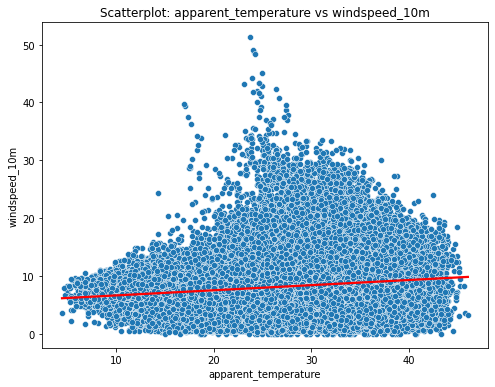


[Numerical vs Numerical] apparent_temperature vs windgusts_10m
Pearson Correlation: 0.415, p-value = 0.0000


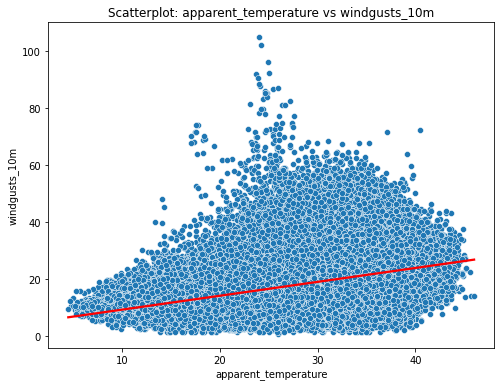


[Numerical vs Numerical] apparent_temperature vs winddirection_10m
Pearson Correlation: -0.394, p-value = 0.0000


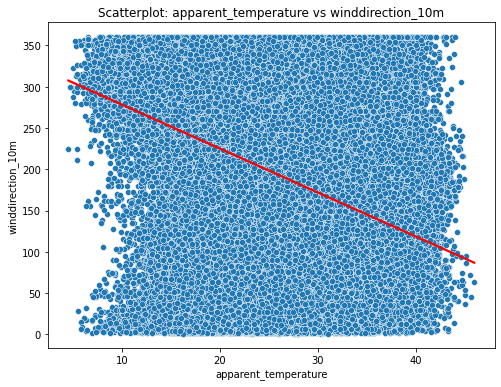


[Numerical vs Numerical] apparent_temperature vs sunshine_duration
Pearson Correlation: 0.336, p-value = 0.0000


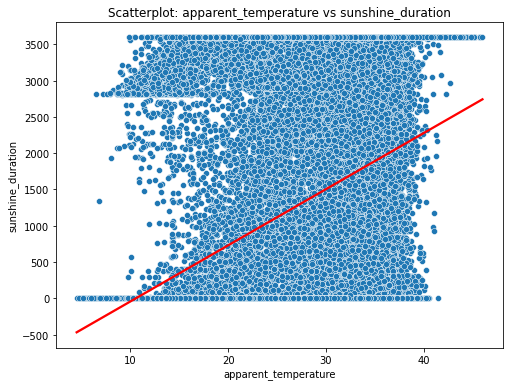


[Numerical vs Numerical] apparent_temperature vs shortwave_radiation
Pearson Correlation: 0.412, p-value = 0.0000


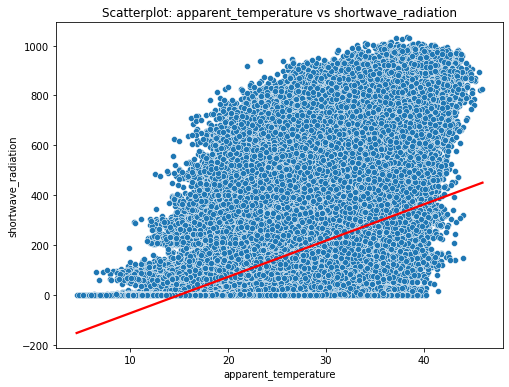


[Numerical vs Numerical] apparent_temperature vs diffuse_radiation
Pearson Correlation: 0.472, p-value = 0.0000


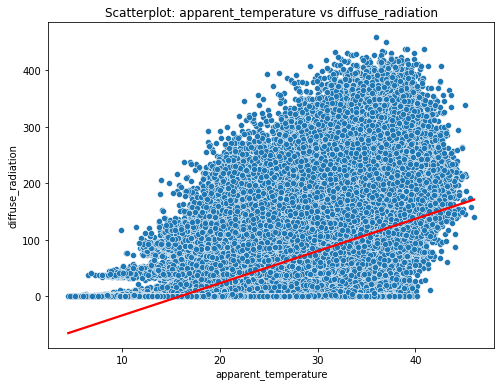


[Numerical vs Numerical] apparent_temperature vs direct_radiation
Pearson Correlation: 0.337, p-value = 0.0000


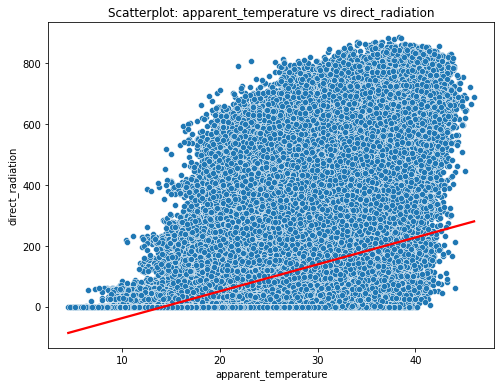


[Numerical vs Numerical] apparent_temperature vs terrestrial_radiation
Pearson Correlation: 0.470, p-value = 0.0000


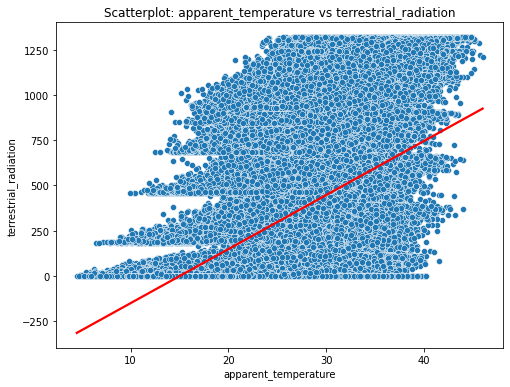


[Numerical vs Numerical] precipitation vs pressure_msl
Pearson Correlation: -0.210, p-value = 0.0000


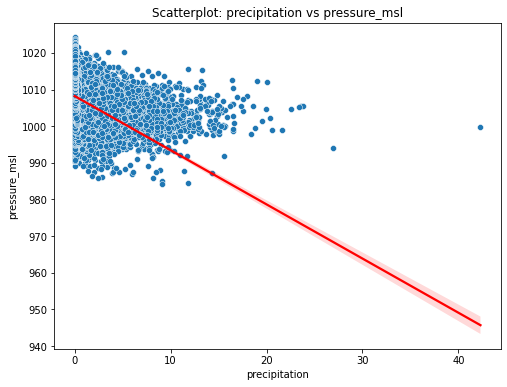


[Numerical vs Numerical] precipitation vs cloudcover
Pearson Correlation: 0.267, p-value = 0.0000


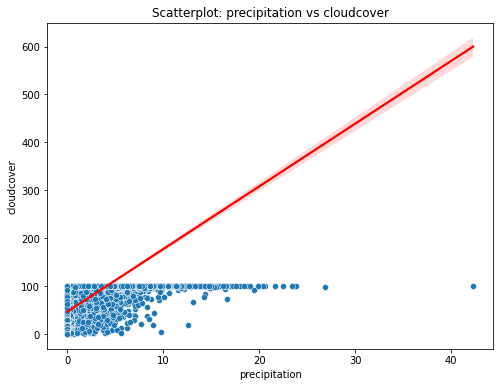


[Numerical vs Numerical] precipitation vs cloudcover_low
Pearson Correlation: 0.281, p-value = 0.0000


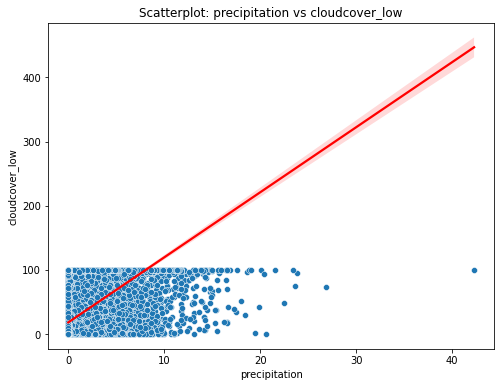


[Numerical vs Numerical] precipitation vs cloudcover_mid
Pearson Correlation: 0.322, p-value = 0.0000


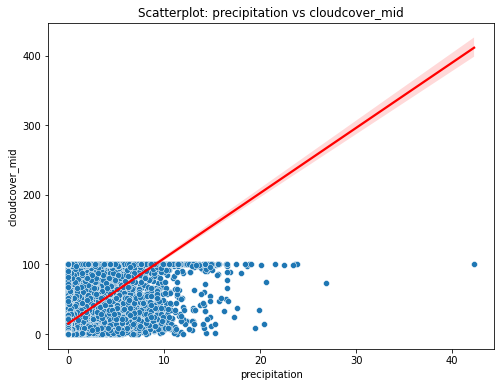


[Numerical vs Numerical] precipitation vs cloudcover_high
Pearson Correlation: 0.270, p-value = 0.0000


In [ ]:
analyzer = BivariateAnalyzer(main_df)

for col1, col2 in all_pairs:
    analyzer.analyze(col1, col2)